# 🧠 BraTS Brain Tumor Segmentation & Detection Pipeline

## Complete End-to-End System: From MRI to Clinical Report

This notebook implements a **complete medical AI pipeline** for brain tumor analysis from multi-modal MRI scans.

## 📋 Pipeline Overview

### Phase 1: Model Training
1. **Data Loading**: Load BraTS Task01 4D multi-modal MRI (FLAIR, T1w, T1gd, T2w)
2. **Preprocessing**: Normalize, augment, and patch-crop volumes for GPU efficiency
3. **Model Architecture**: 3D U-Net for voxel-wise segmentation (4 classes)
4. **Training**: DiceCE loss with BraTS metrics (WT/TC/ET Dice)
5. **Validation & Checkpointing**: Save best models based on average Dice

### Phase 2: Evaluation & Analysis 
6. **Full-Volume Inference**: Sliding window inference on complete 3D volumes
7. **BraTS Metrics**: Compute per-case and cohort-averaged WT/TC/ET Dice scores

### Phase 3: Detection & Measurement 
8. **Bounding Box Extraction**: Convert segmentation masks to 3D lesion detections
9. **Volume & Centroid Calculation**: Physical measurements from prediction masks
10. **Structured Findings**: Package results into machine-readable JSON

### Phase 4: Clinical Reporting
11. **LLM Integration**: Generate natural-language radiology reports via Ollama
12. **Fact-Locked Reporting**: Ensure no hallucinations, only data-driven findings


In [ ]:
# Install required packages for medical imaging, deep learning, and visualization
# Uncomment torch installation line if needed for your CUDA version
%pip install monai nibabel numpy matplotlib 
#torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Note: you may need to restart the kernel to use updated packages.


# Imports and Device Configuration

In [ ]:
# Core Python & Scientific Computing
import os
import json
import numpy as np
from pathlib import Path
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

# Deep Learning (PyTorch)
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# Medical Imaging
import nibabel as nib  # NIfTI file I/O
from scipy.ndimage import center_of_mass, find_objects  # Volume analysis
from scipy import ndimage  # Connected component analysis

# MONAI (Medical Open Network for AI)
from monai.networks.nets import UNet  # 3D U-Net architecture
from monai.losses import DiceLoss, DiceCELoss  # Segmentation losses
from monai.inferers import sliding_window_inference  # Full-volume inference
from monai.transforms import (
    Compose,
    LoadImaged,
    EnsureChannelFirstd,
    Orientationd,
    Spacingd,
    ScaleIntensityRanged,
    CropForegroundd,
    RandCropByPosNegLabeld,
    CenterSpatialCropd,
    RandRotate90d,
    RandFlipd,
    ToTensord,
)

# Visualization
import matplotlib.pyplot as plt
from celluloid import Camera
from IPython.display import HTML

# LLM Integration
import requests  # For Ollama API calls

# ============================================================================
# Device Configuration
# ============================================================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✓ Using device: {device}")
if torch.cuda.is_available():
    print(f"  GPU: {torch.cuda.get_device_name(0)}")
    print(f"  Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

✓ Using device: cuda
  GPU: NVIDIA GeForce RTX 3060 Laptop GPU
  Memory: 6.44 GB


# Data Configuration & Paths

## 📂 BraTS Dataset Structure

This cell automatically finds your BraTS Task01 dataset. Expected structure:

```
Data/
└── Task01_BrainTumour/
    ├── imagesTr/          # Training images (4D NIfTI: BRATS_XXX.nii.gz)
    │   └── BRATS_001.nii.gz → (240, 240, 155, 4)  [FLAIR, T1, T1gd, T2]
    └── labelsTr/          # Training labels (3D NIfTI with classes 0-3)
        └── BRATS_001.nii.gz → (240, 240, 155)
```

**Note:** The script tries multiple paths automatically. If not found, update `DATA_ROOT` manually.

In [3]:
# Configure data paths
# Try to find the data directory relative to the notebook location
notebook_dir = os.path.dirname(os.path.abspath(''))  # Get notebook directory
project_root = os.path.dirname(notebook_dir) if 'notebooks' in notebook_dir else notebook_dir

# Try multiple possible paths
possible_roots = [
    os.path.join(project_root, "Data"),  # Relative to project root
    "Data",  # Relative to current working directory
    os.path.join(os.getcwd(), "Data"),  # Absolute from current working directory
]

DATA_ROOT = None
for root in possible_roots:
    test_path = os.path.join(root, "Task01_BrainTumour", "imagesTr")
    if os.path.exists(test_path):
        DATA_ROOT = root
        break

if DATA_ROOT is None:
    # Fallback: use relative path
    DATA_ROOT = "Data"

IMAGES_DIR = os.path.join(DATA_ROOT, "Task01_BrainTumour", "imagesTr")
LABELS_DIR = os.path.join(DATA_ROOT, "Task01_BrainTumour", "labelsTr")

# Convert to absolute paths for clarity
IMAGES_DIR = os.path.abspath(IMAGES_DIR)
LABELS_DIR = os.path.abspath(LABELS_DIR)

print(f"Looking for data in:")
print(f"  DATA_ROOT: {os.path.abspath(DATA_ROOT)}")
print(f"  IMAGES_DIR: {IMAGES_DIR}")
print(f"  LABELS_DIR: {LABELS_DIR}")

# Verify paths exist
if os.path.exists(IMAGES_DIR):
    print(f"\n✓ Images directory found: {IMAGES_DIR}")
    image_files = [f for f in os.listdir(IMAGES_DIR) if f.endswith('.nii.gz') and not f.startswith('._')]
    print(f"  Found {len(image_files)} image files")
else:
    print(f"\n✗ Warning: Images directory not found at {IMAGES_DIR}")
    print("  Please update DATA_ROOT to point to your BraTS dataset")

if os.path.exists(LABELS_DIR):
    print(f"\n✓ Labels directory found: {LABELS_DIR}")
    label_files = [f for f in os.listdir(LABELS_DIR) if f.endswith('.nii.gz') and not f.startswith('._')]
    print(f"  Found {len(label_files)} label files")
else:
    print(f"\n✗ Warning: Labels directory not found at {LABELS_DIR}")

Looking for data in:
  DATA_ROOT: c:\Users\FERRA\OneDrive\Documents\github\BT-pipe\Data
  IMAGES_DIR: c:\Users\FERRA\OneDrive\Documents\github\BT-pipe\Data\Task01_BrainTumour\imagesTr
  LABELS_DIR: c:\Users\FERRA\OneDrive\Documents\github\BT-pipe\Data\Task01_BrainTumour\labelsTr

✓ Images directory found: c:\Users\FERRA\OneDrive\Documents\github\BT-pipe\Data\Task01_BrainTumour\imagesTr
  Found 484 image files

✓ Labels directory found: c:\Users\FERRA\OneDrive\Documents\github\BT-pipe\Data\Task01_BrainTumour\labelsTr
  Found 484 label files


# Custom PyTorch Dataset

## 🔧 BraTS Dataset Class

**Purpose:** Load and preprocess BraTS multi-modal MRI volumes and segmentation masks.

**Key Features:**
- ✅ Loads 4D multi-modal MRI (4 channels: FLAIR, T1w, T1gd, T2w)
- ✅ Loads 3D segmentation labels (classes 0-3)
- ✅ Per-modality Z-score normalization (excludes background)
- ✅ Percentile clipping (1st-99th) to remove outliers
- ✅ Handles label remapping (class 4 → 3 if present)
- ✅ Returns dict: `{'image': tensor, 'label': tensor, 'case_id': str}`

**Data Flow:**
```
NIfTI file → numpy array → channel-first → normalize → PyTorch tensor
```

In [4]:
class BraTSDataset(Dataset):
    """
    BraTS Task01 Dataset for 3D multi-class segmentation.
    
    Input: 4D NIfTI (240, 240, 155, 4) - FLAIR, T1w, T1gd, T2w
    Output: 3D NIfTI (240, 240, 155) - classes 0-3
    """
    
    def __init__(self, images_dir, labels_dir, case_ids=None, transform=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.transform = transform
        
        # Get all case IDs (filter out macOS metadata files)
        if case_ids is None:
            image_files = sorted([
                f for f in os.listdir(images_dir) 
                if f.endswith('.nii.gz') and not f.startswith('._')
            ])
            self.case_ids = [f.replace('.nii.gz', '') for f in image_files]
        else:
            self.case_ids = case_ids
        
        print(f"Initialized BraTS dataset with {len(self.case_ids)} cases")
    
    def __len__(self):
        return len(self.case_ids)
    
    def __getitem__(self, idx):
        case_id = self.case_ids[idx]
        
        # Load image (4D: H, W, D, 4)
        image_path = os.path.join(self.images_dir, f"{case_id}.nii.gz")
        label_path = os.path.join(self.labels_dir, f"{case_id}.nii.gz")
        
        # Load NIfTI files
        image_nii = nib.load(image_path)
        label_nii = nib.load(label_path)
        
        # Get data arrays
        image_data = image_nii.get_fdata()  # (H, W, D, 4)
        label_data = label_nii.get_fdata().astype(np.int32)  # (H, W, D)
        
        # Convert to channel-first: (4, H, W, D)
        image_data = np.transpose(image_data, (3, 0, 1, 2))
        
        # Add channel dimension to label: (1, H, W, D)
        label_data = np.expand_dims(label_data, axis=0)
        
        # Ensure label values are in range [0, 3]
        # Some BraTS releases use label 4 for enhancing tumor, remap to 3
        label_data = np.clip(label_data, 0, 3)
        if np.any(label_data == 4):
            label_data[label_data == 4] = 3
        
        # Normalize each modality independently
        for c in range(image_data.shape[0]):
            modality = image_data[c]
            # Clip outliers (top 1% and bottom 1%)
            p1, p99 = np.percentile(modality[modality > 0], [1, 99])
            modality = np.clip(modality, p1, p99)
            # Z-score normalization
            mean = modality[modality > 0].mean()
            std = modality[modality > 0].std()
            if std > 0:
                modality = (modality - mean) / std
            image_data[c] = modality
        
        # Convert to tensors
        image_tensor = torch.from_numpy(image_data).float()
        label_tensor = torch.from_numpy(label_data).long()
        
        sample = {
            'image': image_tensor,
            'label': label_tensor,
            'case_id': case_id
        }
        
        if self.transform:
            sample = self.transform(sample)
        
        return sample

# SECTION 4: Data Augmentation & Preprocessing

## 🔄 MONAI Transforms Pipeline

**Training Pipeline:**
1. **Orientationd**: Standardize to RAS orientation
2. **Spacingd**: Resample to 1×1×1 mm isotropic voxels (bilinear for image, nearest for labels)
3. **RandCropByPosNegLabeld**: Extract 128³ patches (balanced tumor/background sampling)
4. **Data Augmentation**:
   - Random 90° rotations
   - Random flips (horizontal & vertical)
5. **ToTensord**: Convert to PyTorch tensors

**Validation Pipeline:**
- Same as training but **no augmentation**
- Center crop to 128³ for consistent evaluation

⚠️ **Critical:** Labels always use **nearest-neighbor interpolation** to preserve class integrity (no anti-aliasing).

In [5]:
# Define transforms for training
train_transforms = Compose([
    # LoadImaged and EnsureChannelFirstd are handled in dataset
    Orientationd(keys=["image", "label"], axcodes="RAS"),
    Spacingd(
        keys=["image", "label"],
        pixdim=(1.0, 1.0, 1.0),
        mode=("bilinear", "nearest"),  # bilinear for image, nearest for labels
    ),
    # Patch-based cropping for GPU memory efficiency
    # Note: num_samples=1 to avoid list batching issues
    # The DataLoader will handle batching multiple patches
    RandCropByPosNegLabeld(
        keys=["image", "label"],
        label_key="label",
        spatial_size=(128, 128, 128),  # Adjust based on GPU memory
        pos=1,
        neg=1,
        num_samples=1,  # One patch per sample (DataLoader handles batching)
    ),
    # Data augmentation
    RandRotate90d(keys=["image", "label"], prob=0.5, spatial_axes=(0, 1)),
    RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=0),
    RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=1),
    ToTensord(keys=["image", "label"]),
])

# Validation transforms (no augmentation, center crop to match training patch size)
val_transforms = Compose([
    Orientationd(keys=["image", "label"], axcodes="RAS"),
    Spacingd(
        keys=["image", "label"],
        pixdim=(1.0, 1.0, 1.0),
        mode=("bilinear", "nearest"),
    ),
    # Center crop to match training patch size
    CenterSpatialCropd(
        keys=["image", "label"],
        roi_size=(128, 128, 128),  # Match training patch size
    ),
    ToTensord(keys=["image", "label"]),
])

#  Model Architecture

## 🏗️ 3D U-Net Model

**Architecture:** MONAI's 3D U-Net with residual connections

**Configuration:**
- **Input**: 4 channels (FLAIR, T1w, T1gd, T2w)
- **Output**: 4 classes (background, edema, non-enhancing, enhancing)
- **Features**: [32, 64, 128, 256] channels per encoder/decoder level
- **Spatial Dims**: 3D (volumetric convolutions)
- **Residual Units**: 2 per block (better gradient flow)
- **Normalization**: Batch Norm
- **Activation**: PReLU
- **Dropout**: 0.1 (regularization)

**Model Size:** ~4.75M trainable parameters

**Data Flow:**
```
Input (4, H, W, D) → Encoder → Bottleneck → Decoder → Output (4, H, W, D)
```

In [6]:
def create_3d_unet(in_channels=4, out_channels=4, features=(32, 64, 128, 256)):
    """
    Create a 3D U-Net model for BraTS segmentation.
    
    Args:
        in_channels: Number of input channels (4 for BraTS: FLAIR, T1w, T1gd, T2w)
        out_channels: Number of output classes (4: background, edema, non-enhancing, enhancing)
        features: Feature sizes for each level of the U-Net
    
    Returns:
        UNet model
    """
    model = UNet(
        spatial_dims=3,
        in_channels=in_channels,
        out_channels=out_channels,
        channels=features,
        strides=(2, 2, 2),
        num_res_units=2,  # Residual units for better gradient flow
        norm="batch",  # Batch normalization
        act="prelu",  # PReLU activation
        dropout=0.1,  # Dropout for regularization
    )
    return model

# Create model
model = create_3d_unet(in_channels=4, out_channels=4)
model = model.to(device)

# Print model summary
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Model created:")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Input shape: (batch, 4, H, W, D)")
print(f"  Output shape: (batch, 4, H, W, D)")

Model created:
  Total parameters: 4,751,149
  Trainable parameters: 4,751,149
  Input shape: (batch, 4, H, W, D)
  Output shape: (batch, 4, H, W, D)


# Loss Function

## 📉 Combined DiceCE Loss

**Why DiceCE?** Combines strengths of two complementary losses:

| Loss Component | Purpose | Weight |
|----------------|---------|--------|
| **Dice Loss** | Handles class imbalance, directly optimizes overlap (IoU-like) | 0.5 |
| **CrossEntropy** | Provides stable gradients, pixel-wise classification | 0.5 |

**Configuration:**
- `to_onehot_y=True`: Converts integer labels to one-hot encoding
- `softmax=True`: Applies softmax to model outputs
- `squared_pred=True`: Squares predictions in Dice calculation (more stable)
- `smooth_nr=1e-5, smooth_dr=1e-5`: Numerical stability (avoids division by zero)

**Result:** Robust training for highly imbalanced medical segmentation tasks.

In [7]:
# Combined Dice + CrossEntropy loss
# This handles class imbalance well
loss_function = DiceCELoss(
    to_onehot_y=True,  # Convert labels to one-hot
    softmax=True,  # Apply softmax to predictions
    squared_pred=True,  # Square predictions in Dice
    smooth_nr=1e-5,  # Smoothing for numerical stability
    smooth_dr=1e-5,
    lambda_dice=0.5,  # Weight for Dice component
    lambda_ce=0.5,  # Weight for CrossEntropy component
)

print("Loss function: DiceCELoss (Dice + CrossEntropy)")

Loss function: DiceCELoss (Dice + CrossEntropy)


# BraTS Evaluation Metrics

## 📊 BraTS Region-Based Dice Scores

**Official BraTS Evaluation:** Compute Dice coefficients for **three hierarchical regions**:

| Region | Classes | Clinical Meaning |
|--------|---------|------------------|
| **WT** (Whole Tumor) | 1 \| 2 \| 3 | Complete tumor extent (edema + core + enhancing) |
| **TC** (Tumor Core) | 2 \| 3 | Solid tumor mass (non-enhancing + enhancing) |
| **ET** (Enhancing Tumor) | 3 | Active/aggressive tumor (contrast-enhancing) |

**Dice Coefficient Formula:**
```
Dice = (2 × |Pred ∩ GT|) / (|Pred| + |GT|)
```

**Range:** [0, 1], where 1 = perfect overlap

**Note:** This function handles both logits (B, 4, H, W, D) and class indices (B, H, W, D).

In [8]:
def compute_brats_regions(pred, label):
    """
    Compute BraTS regions from predictions and labels.
    
    Args:
        pred: Predicted segmentation (B, 4, H, W, D) or (B, H, W, D) with class indices
        label: Ground truth (B, H, W, D) with class indices
    
    Returns:
        Dictionary with Dice scores for WT, TC, ET
    """
    # Convert to class indices if needed
    if pred.dim() == 5:  # (B, 4, H, W, D) - logits
        pred = torch.argmax(pred, dim=1)  # (B, H, W, D)
    
    # Ensure same shape
    assert pred.shape == label.shape, f"Shape mismatch: pred {pred.shape} vs label {label.shape}"
    
    # Define BraTS regions
    # WT (Whole Tumor) = classes 1, 2, 3
    wt_pred = (pred > 0).float()
    wt_label = (label > 0).float()
    
    # TC (Tumor Core) = classes 2, 3
    tc_pred = ((pred == 2) | (pred == 3)).float()
    tc_label = ((label == 2) | (label == 3)).float()
    
    # ET (Enhancing Tumor) = class 3
    et_pred = (pred == 3).float()
    et_label = (label == 3).float()
    
    # Compute Dice for each region
    def dice_score(pred_binary, label_binary):
        intersection = (pred_binary * label_binary).sum()
        union = pred_binary.sum() + label_binary.sum()
        if union == 0:
            return 1.0  # Both empty
        return (2.0 * intersection) / (union + 1e-8)
    
    wt_dice = dice_score(wt_pred, wt_label)
    tc_dice = dice_score(tc_pred, tc_label)
    et_dice = dice_score(et_pred, et_label)
    
    return {
        'WT': wt_dice.item(),
        'TC': tc_dice.item(),
        'ET': et_dice.item()
    }

# Test the function
print("BraTS metrics function ready")

BraTS metrics function ready


# Training Configuration

## ⚙️ Optimizer, Scheduler & Mixed Precision

**Optimizer:** AdamW (Adam with weight decay)
- Learning rate: 1e-4
- Weight decay: 1e-5 (L2 regularization)

**Learning Rate Scheduler:** ReduceLROnPlateau
- Monitors: Validation Dice (maximize)
- Reduction factor: 0.5× when plateau detected
- Patience: 10 epochs

**Mixed Precision Training:**
- Uses `torch.cuda.amp.GradScaler` for FP16/FP32 mixed precision
- **Benefits:** 2-3× faster training, reduced memory usage
- Automatically enabled if CUDA is available

**Hyperparameters:**
- `BATCH_SIZE`: Adjust based on GPU memory (8 for 3D volumes on 16GB+ GPU)
- `NUM_EPOCHS`: Set to desired training duration
- `VAL_INTERVAL`: Validation frequency (every N epochs)

In [9]:
# Training hyperparameters
LEARNING_RATE = 1e-4
BATCH_SIZE = 6  # Adjust based on GPU memory (3D volumes are memory-intensive)
NUM_EPOCHS = 10
VAL_INTERVAL = 5  # Validate every N epochs

# Optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=10, verbose=True
)

# Mixed precision scaler
scaler = torch.cuda.amp.GradScaler() if device.type == 'cuda' else None

print(f"Training configuration:")
print(f"  Learning rate: {LEARNING_RATE}")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Epochs: {NUM_EPOCHS}")
print(f"  Mixed precision: {scaler is not None}")

Training configuration:
  Learning rate: 0.0001
  Batch size: 6
  Epochs: 10
  Mixed precision: True


# Data Loaders

## 🔀 Train/Validation Split & DataLoaders

**Split Strategy:** 80% train / 20% validation (stratified by case IDs)

**DataLoader Configuration:**
- **Training**: Shuffled, batch_size=8, with augmentation
- **Validation**: Sequential, batch_size=1 (full-volume evaluation)
- **num_workers**: 0 on Windows (multiprocessing issues), 2 on Linux/Mac
- **pin_memory**: Enabled for CUDA (faster host→device transfers)

**Output:** Ready-to-use `train_loader` and `val_loader` for training loop.

In [10]:
# Get all case IDs (filter out macOS metadata files)
if os.path.exists(IMAGES_DIR):
    all_image_files = sorted([
        f.replace('.nii.gz', '') 
        for f in os.listdir(IMAGES_DIR) 
        if f.endswith('.nii.gz') and not f.startswith('._')
    ])
    
    # Split into train/val (80/20)
    split_idx = int(0.8 * len(all_image_files))
    train_case_ids = all_image_files[:split_idx]
    val_case_ids = all_image_files[split_idx:]
    
    print(f"Dataset split:")
    print(f"  Training cases: {len(train_case_ids)}")
    print(f"  Validation cases: {len(val_case_ids)}")
    
    # Create datasets
    train_dataset = BraTSDataset(IMAGES_DIR, LABELS_DIR, train_case_ids, transform=train_transforms)
    val_dataset = BraTSDataset(IMAGES_DIR, LABELS_DIR, val_case_ids, transform=val_transforms)
    
    # Create data loaders
    # Note: num_workers=0 on Windows to avoid multiprocessing issues
    # On Linux/Mac, you can use num_workers > 0 for faster data loading
    import sys
    num_workers = 0 if sys.platform == 'win32' else 2
    
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True if device.type == 'cuda' else False,
    )
    
    val_loader = DataLoader(
        val_dataset,
        batch_size=1,  # Validation with full volumes
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True if device.type == 'cuda' else False,
    )
    
    print(f"Data loaders created")
else:
    print("Warning: Dataset not found. Please update DATA_ROOT path.")
    train_loader = None
    val_loader = None

Dataset split:
  Training cases: 387
  Validation cases: 97
Initialized BraTS dataset with 387 cases
Initialized BraTS dataset with 97 cases
Data loaders created


# Training & Validation Functions

## 🏃 Training Loop Implementation

**Training Function (`train_epoch`):**
1. Set model to training mode
2. Iterate through batches
3. Forward pass with mixed precision
4. Compute loss (DiceCE)
5. Backpropagate and update weights
6. Track and report progress every 10 batches

**Validation Function (`validate`):**
1. Set model to evaluation mode (no gradients)
2. Iterate through validation cases
3. Forward pass with mixed precision
4. Compute loss and BraTS metrics (WT/TC/ET Dice)
5. Aggregate per-case metrics into cohort averages

**Outputs:** 
- `train_loss`: Average training loss per epoch
- `val_loss`, `val_metrics`: Validation loss and BraTS Dice scores

In [11]:
# Create directory for checkpoints
os.makedirs("runs/checkpoints", exist_ok=True)

# Training history
train_losses = []
val_losses = []
val_metrics_history = {'WT': [], 'TC': [], 'ET': []}
val_avg_dice_history = []
best_val_dice = 0.0

def train_epoch(model, loader, optimizer, loss_fn, scaler, device):
    """Train for one epoch."""
    model.train()
    epoch_loss = 0.0
    num_batches = 0
    
    for batch_idx, batch in enumerate(loader):
        # Handle case where batch might be a list (from RandCropByPosNegLabeld with num_samples > 1)
        if isinstance(batch, list):
            # If batch is a list, take the first element (shouldn't happen with num_samples=1)
            batch = batch[0]
        
        images = batch['image'].to(device)  # (B, 4, H, W, D)
        labels = batch['label'].to(device)  # (B, 1, H, W, D) - keep channel dim for loss function
        
        optimizer.zero_grad()
        
        # Mixed precision forward pass
        if scaler is not None:
            with torch.cuda.amp.autocast():
                outputs = model(images)  # (B, 4, H, W, D)
                loss = loss_fn(outputs, labels)
            
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        
        if (batch_idx + 1) % 10 == 0:
            print(f"  Batch {batch_idx + 1}/{len(loader)}, Loss: {loss.item():.4f}")
    
    return epoch_loss / num_batches

def validate(model, loader, loss_fn, device):
    """Validate model."""
    model.eval()
    val_loss = 0.0
    num_batches = 0
    all_brats_metrics = {'WT': [], 'TC': [], 'ET': []}
    
    with torch.no_grad():
        for batch in loader:
            # Handle case where batch might be a list
            if isinstance(batch, list):
                batch = batch[0]
            
            images = batch['image'].to(device)
            labels = batch['label'].to(device)  # (B, 1, H, W, D) - keep channel dim for loss function
            
            # Forward pass
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    outputs = model(images)
                    loss = loss_fn(outputs, labels)
            else:
                outputs = model(images)
                loss = loss_fn(outputs, labels)
            
            val_loss += loss.item()
            num_batches += 1
            
            # Compute BraTS metrics
            pred_classes = torch.argmax(outputs, dim=1)  # (B, H, W, D)
            labels_squeezed = labels.squeeze(1)  # (B, H, W, D) - remove channel dim for metrics
            for b in range(pred_classes.shape[0]):
                metrics = compute_brats_regions(
                    pred_classes[b:b+1],
                    labels_squeezed[b:b+1]
                )
                for region in ['WT', 'TC', 'ET']:
                    all_brats_metrics[region].append(metrics[region])
    
    avg_loss = val_loss / num_batches
    avg_metrics = {region: np.mean(scores) for region, scores in all_brats_metrics.items()}
    
    return avg_loss, avg_metrics

print("Training functions defined")

Training functions defined


# SECTION 11: Execute Training Loop

## 🚀 Main Training Loop

**Execution Flow:**
1. **Train** for NUM_EPOCHS epochs
2. **Validate** every VAL_INTERVAL epochs
3. **Compute BraTS metrics** (WT/TC/ET Dice)
4. **Save best model** when validation Dice improves
5. **Update learning rate** based on validation performance
6. **Track history** for visualization

**Model Checkpointing:**
- Saves to: `runs/checkpoints/best_model.pth`
- Criteria: Maximum average Dice (WT + TC + ET) / 3
- Contains: model weights, optimizer state, epoch, metrics

**Training Progress:** Displayed with loss values and Dice scores per epoch.

⚠️ **Note:** Adjust `NUM_EPOCHS` based on convergence (typically 100-300 for BraTS).

In [12]:
# Main training loop
if train_loader is not None and val_loader is not None:
    print("Starting training...")
    print("=" * 60)
    
    for epoch in range(1, NUM_EPOCHS + 1):
        print(f"\nEpoch {epoch}/{NUM_EPOCHS}")
        print("-" * 60)
        
        # Train
        train_loss = train_epoch(model, train_loader, optimizer, loss_function, scaler, device)
        train_losses.append(train_loss)
        print(f"Train Loss: {train_loss:.4f}")
        
        # Validate
        if epoch % VAL_INTERVAL == 0:
            val_loss, val_metrics = validate(model, val_loader, loss_function, device)
            val_losses.append(val_loss)
            
            for region in ['WT', 'TC', 'ET']:
                val_metrics_history[region].append(val_metrics[region])
            
            print(f"\nValidation Results:")
            print(f"  Loss: {val_loss:.4f}")
            print(f"  WT Dice: {val_metrics['WT']:.4f}")
            print(f"  TC Dice: {val_metrics['TC']:.4f}")
            print(f"  ET Dice: {val_metrics['ET']:.4f}")
            
            # Average Dice for model selection
            avg_dice = (val_metrics['WT'] + val_metrics['TC'] + val_metrics['ET']) / 3.0
            val_avg_dice_history.append(avg_dice)
            
            # Save best model
            if avg_dice > best_val_dice:
                best_val_dice = avg_dice
                checkpoint_path = "runs/checkpoints/best_model.pth"
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'best_dice': best_val_dice,
                    'val_metrics': val_metrics,
                }, checkpoint_path)
                print(f"  ✓ Saved best model (Avg Dice: {avg_dice:.4f})")
            
            # Update learning rate
            scheduler.step(avg_dice)
        
        print("=" * 60)
    
    print("\nTraining completed!")
    print(f"Best validation Dice: {best_val_dice:.4f}")
else:
    print("Cannot start training: Data loaders not initialized.")
    print("Please update DATA_ROOT path in the configuration cell.")

Starting training...

Epoch 1/10
------------------------------------------------------------
  Batch 10/65, Loss: 1.1431
  Batch 20/65, Loss: 1.0863
  Batch 30/65, Loss: 1.0605
  Batch 40/65, Loss: 1.0275
  Batch 50/65, Loss: 0.9964
  Batch 60/65, Loss: 0.9755
Train Loss: 1.0568

Epoch 2/10
------------------------------------------------------------
  Batch 10/65, Loss: 0.9132
  Batch 20/65, Loss: 0.8789
  Batch 30/65, Loss: 0.8478
  Batch 40/65, Loss: 0.8231
  Batch 50/65, Loss: 0.7995
  Batch 60/65, Loss: 0.7725
Train Loss: 0.8410

Epoch 3/10
------------------------------------------------------------
  Batch 10/65, Loss: 0.6973
  Batch 20/65, Loss: 0.6887
  Batch 30/65, Loss: 0.6510
  Batch 40/65, Loss: 0.6171
  Batch 50/65, Loss: 0.6210
  Batch 60/65, Loss: 0.5855
Train Loss: 0.6482

Epoch 4/10
------------------------------------------------------------
  Batch 10/65, Loss: 0.5775
  Batch 20/65, Loss: 0.5453
  Batch 30/65, Loss: 0.5000
  Batch 40/65, Loss: 0.5096
  Batch 50/65,

# Training Progress Visualization

## 📈 Plot Learning Curves

**Left Plot:** Training & Validation Loss over epochs
- Blue line: Training loss (DiceCE)
- Red line: Validation loss (with markers)

**Right Plot:** BraTS Validation Metrics
- WT Dice (circles)
- TC Dice (squares)
- ET Dice (triangles)
- Average Dice (black dashed line)

**Purpose:** Monitor convergence, detect overfitting, and assess model performance.

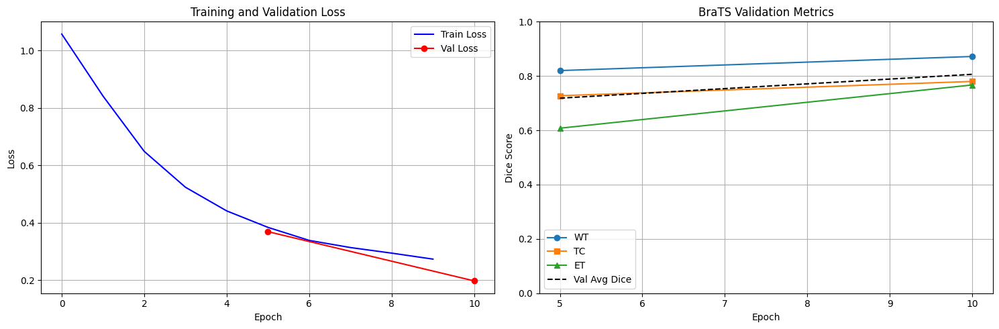

In [13]:
# Plot training curves
if len(train_losses) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Loss curve
    axes[0].plot(train_losses, label='Train Loss', color='blue')
    if len(val_losses) > 0:
        val_epochs = [i * VAL_INTERVAL for i in range(1, len(val_losses) + 1)]
        axes[0].plot(val_epochs, val_losses, label='Val Loss', color='red', marker='o')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Training and Validation Loss')
    axes[0].legend()
    axes[0].grid(True)
    
    # BraTS metrics curve
    if len(val_metrics_history['WT']) > 0:
        val_epochs = [i * VAL_INTERVAL for i in range(1, len(val_metrics_history['WT']) + 1)]
        axes[1].plot(val_epochs, val_metrics_history['WT'], label='WT', marker='o')
        axes[1].plot(val_epochs, val_metrics_history['TC'], label='TC', marker='s')
        axes[1].plot(val_epochs, val_metrics_history['ET'], label='ET', marker='^')
        if len(val_avg_dice_history) > 0:
            axes[1].plot(val_epochs, val_avg_dice_history, label='Val Avg Dice', linestyle='--', color='black')
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Dice Score')
        axes[1].set_title('BraTS Validation Metrics')
        axes[1].legend()
        axes[1].grid(True)
        axes[1].set_ylim([0, 1])
    
    plt.tight_layout()
    plt.show()
else:
    print("No training data to plot. Run training first.")

# Single-Case Inference & Visualization


## 🔍 Qualitative Evaluation: Visual Inspection

**Purpose:** Visualize model predictions vs. ground truth for qualitative assessment.

**6-Panel Layout:**
1. **FLAIR Modality**: Raw input MRI
2. **Ground Truth**: Manual expert segmentation
3. **Prediction**: Model output segmentation
4. **GT Overlay**: Ground truth on FLAIR
5. **Pred Overlay**: Prediction on FLAIR
6. **Metrics Panel**: WT/TC/ET Dice scores

**Slice Selection:** Middle axial slice (z-axis center)

**Color Map:** `nipy_spectral` (background=black, edema/core/enhancing=colors)

Visualizing prediction on a validation case...


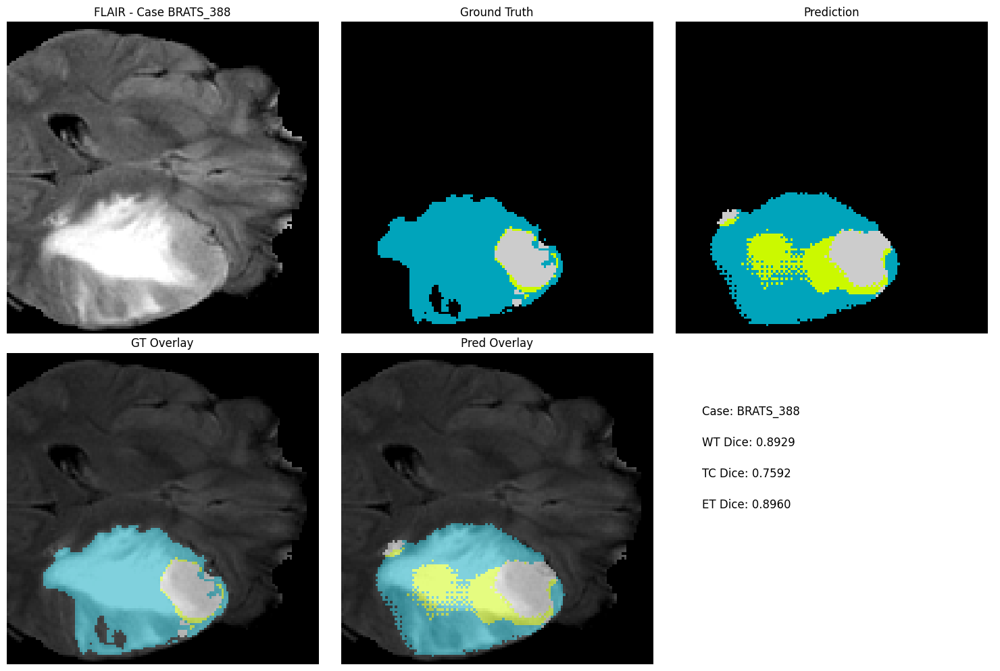


Metrics: {'WT': 0.8928850293159485, 'TC': 0.7591761946678162, 'ET': 0.8959680199623108}


In [14]:
def visualize_prediction(model, dataset, case_idx, device, save_path=None):
    """Visualize prediction for a single case."""
    model.eval()
    
    # Get a case
    sample = dataset[case_idx]
    case_id = sample['case_id']
    image = sample['image'].unsqueeze(0).to(device)  # Add batch dim
    label = sample['label'].squeeze(0).numpy()  # Remove batch and channel dims
    
    # Predict
    with torch.no_grad():
        if scaler is not None:
            with torch.cuda.amp.autocast():
                output = model(image)
        else:
            output = model(image)
        
        pred = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()
    
    # Get middle slice for visualization
    mid_slice = image.shape[3] // 2
    
    # Visualize
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Show FLAIR (channel 0)
    axes[0, 0].imshow(image[0, 0, :, :, mid_slice].cpu().numpy(), cmap='gray')
    axes[0, 0].set_title(f'FLAIR - Case {case_id}')
    axes[0, 0].axis('off')
    
    # Ground truth
    axes[0, 1].imshow(label[:, :, mid_slice], cmap='nipy_spectral', vmin=0, vmax=3)
    axes[0, 1].set_title('Ground Truth')
    axes[0, 1].axis('off')
    
    # Prediction
    axes[0, 2].imshow(pred[:, :, mid_slice], cmap='nipy_spectral', vmin=0, vmax=3)
    axes[0, 2].set_title('Prediction')
    axes[0, 2].axis('off')
    
    # Overlay on FLAIR
    flair_slice = image[0, 0, :, :, mid_slice].cpu().numpy()
    axes[1, 0].imshow(flair_slice, cmap='gray')
    axes[1, 0].imshow(label[:, :, mid_slice], alpha=0.5, cmap='nipy_spectral', vmin=0, vmax=3)
    axes[1, 0].set_title('GT Overlay')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(flair_slice, cmap='gray')
    axes[1, 1].imshow(pred[:, :, mid_slice], alpha=0.5, cmap='nipy_spectral', vmin=0, vmax=3)
    axes[1, 1].set_title('Pred Overlay')
    axes[1, 1].axis('off')
    
    # Compute metrics
    metrics = compute_brats_regions(
        torch.from_numpy(pred).unsqueeze(0),
        torch.from_numpy(label).unsqueeze(0)
    )
    
    axes[1, 2].text(0.1, 0.8, f'Case: {case_id}', fontsize=12, transform=axes[1, 2].transAxes)
    axes[1, 2].text(0.1, 0.7, f'WT Dice: {metrics["WT"]:.4f}', fontsize=12, transform=axes[1, 2].transAxes)
    axes[1, 2].text(0.1, 0.6, f'TC Dice: {metrics["TC"]:.4f}', fontsize=12, transform=axes[1, 2].transAxes)
    axes[1, 2].text(0.1, 0.5, f'ET Dice: {metrics["ET"]:.4f}', fontsize=12, transform=axes[1, 2].transAxes)
    axes[1, 2].axis('off')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Visualization saved to {save_path}")
    
    plt.show()
    
    return metrics

# Test on a validation case
if val_loader is not None and len(val_dataset) > 0:
    print("Visualizing prediction on a validation case...")
    test_metrics = visualize_prediction(model, val_dataset, 0, device)
    print(f"\nMetrics: {test_metrics}")
else:
    print("Cannot visualize: Validation dataset not available.")

# SECTION 14: 3D Volume Animation (Optional)

## 🎬 Animated Slice-by-Slice Visualization

**Purpose:** Create an animated visualization showing all axial slices through the volume.

**Visualization:**
- **Modality**: T1w (channel 1)
- **Overlay**: Ground truth segmentation mask
- **Animation**: Iterates through z-axis slices
- **Output**: HTML5 video (playable in notebook)

**Requirements:** `celluloid` package (installed in cell 28)

Load a previously saved checkpoint for inference or continued training.

In [15]:
%pip install -q celluloid

Note: you may need to restart the kernel to use updated packages.


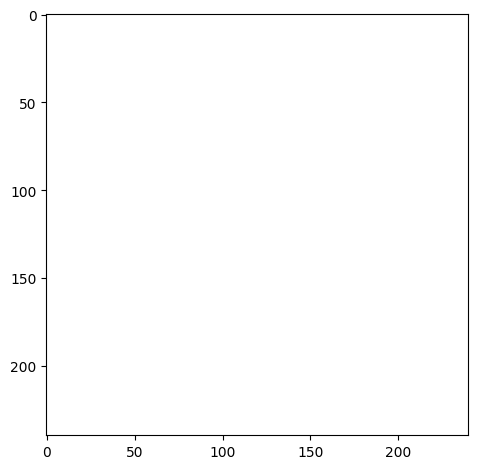

In [16]:
from celluloid import Camera
from IPython.display import HTML

if val_loader is not None and len(val_dataset) > 0:
    case_id = val_dataset[0]['case_id']
    image_path = os.path.join(IMAGES_DIR, f"{case_id}.nii.gz")
    label_path = os.path.join(LABELS_DIR, f"{case_id}.nii.gz")
    
    if os.path.exists(image_path) and os.path.exists(label_path):
        image_data = nib.load(image_path).get_fdata()        # (H, W, D, 4)
        label_data = nib.load(label_path).get_fdata().astype(int)  # (H, W, D)
        
        fig = plt.figure()
        camera = Camera(fig)
        
        # Iterate over slices in the z-axis
        for i in range(image_data.shape[2]):
            plt.imshow(image_data[:, :, i, 1], cmap="bone")  # modality 1 (T1w) shown here
            mask = np.ma.masked_where(label_data[:, :, i] == 0, label_data[:, :, i])
            plt.imshow(mask, alpha=0.5)
            camera.snap()
        
        plt.tight_layout()
        animation = camera.animate()
        
        # Display as HTML5 video
        display(HTML(animation.to_jshtml()))
    else:
        print(f"Image or label not found for case {case_id}.")
else:
    print("Cannot animate: Validation dataset not available.")

# Model Checkpoint Loading

## 💾 Load Pre-Trained Model

**Purpose:** Resume training or perform inference with a saved model.

**Function:** `load_checkpoint(path, model, optimizer=None)`

**Loads:**
- Model weights (`model_state_dict`)
- Optimizer state (`optimizer_state_dict`, optional)
- Training metadata (epoch, best_dice, val_metrics)

**Use Cases:**
- Resume interrupted training
- Perform inference on new cases
- Fine-tune on different datasets

**Example:**
```python
checkpoint = load_checkpoint("runs/checkpoints/best_model.pth", model, optimizer)
```

In [21]:
# Load checkpoint
def load_checkpoint(checkpoint_path, model, optimizer=None):
    """Load model checkpoint."""
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        
        if optimizer is not None and 'optimizer_state_dict' in checkpoint:
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        
        print(f"Loaded checkpoint from epoch {checkpoint.get('epoch', 'unknown')}")
        if 'best_dice' in checkpoint:
            print(f"Best validation Dice: {checkpoint['best_dice']:.4f}")
        if 'val_metrics' in checkpoint:
            print(f"Validation metrics: {checkpoint['val_metrics']}")
        
        return checkpoint
    else:
        print(f"Checkpoint not found at {checkpoint_path}")
        return None

# Example: Load best model
checkpoint = load_checkpoint("runs/checkpoints/best_model.pth", model, optimizer)

Loaded checkpoint from epoch 10
Best validation Dice: 0.8064
Validation metrics: {'WT': np.float64(0.8719619094710989), 'TC': np.float64(0.7800085083725526), 'ET': np.float64(0.7670886786942629)}


# Full-Volume Evaluation & BraTS Metrics

## 🎯 Quantitative Evaluation on Complete 3D Volumes

**Goal:** Compute official BraTS metrics (WT/TC/ET Dice) on full-resolution volumes.

**Key Difference from Training:**
- Training uses 128³ patches (memory efficiency)
- Evaluation uses **sliding window inference** on full volumes (240×240×155)

**Sliding Window Inference:**
- **ROI Size**: 128³ (matches training patch size)
- **Overlap**: 0.5 (50% overlap between windows)
- **Aggregation**: Gaussian-weighted blending (smoother predictions)
- **Mode**: `mode="gaussian"` (importance weighting)

**Outputs:**
- `per_case_metrics`: List of dicts with WT/TC/ET Dice per case
- `summary`: Cohort-averaged metrics (mean WT/TC/ET)

**Use Case:** Official BraTS Challenge submission format and benchmark comparison.

**Example:**
```python
per_case_metrics, summary = evaluate_brats_full(model, val_dataset, device)
```


In [ ]:
from monai.inferers import sliding_window_inference


def evaluate_brats_full(model, dataset, device, roi_size=(128, 128, 128), sw_batch_size=1):
    """Full-volume BraTS evaluation with WT/TC/ET Dice per case.

    Args:
        model: Trained 3D UNet.
        dataset: Dataset yielding dicts with keys 'image', 'label', 'case_id'.
        device: torch.device.
        roi_size: Sliding window ROI size.
        sw_batch_size: Number of windows processed in parallel.

    Returns:
        per_case_metrics: list of dicts { 'case_id', 'WT', 'TC', 'ET' }.
        summary: dict with mean WT/TC/ET.
    """
    model.eval()
    per_case_metrics = []

    with torch.no_grad():
        for idx in range(len(dataset)):
            sample = dataset[idx]
            image = sample["image"].unsqueeze(0).to(device)  # (1, 4, H, W, D)
            label = sample["label"].to(device)               # (1, H, W, D)
            case_id = sample.get("case_id", f"case_{idx}")

            # Sliding window inference for full-volume prediction
            logits = sliding_window_inference(
                inputs=image,
                roi_size=roi_size,
                sw_batch_size=sw_batch_size,
                predictor=model,
                mode="gaussian",
                overlap=0.5,
            )  # (1, 4, H, W, D)

            # Convert to class labels
            pred_classes = torch.argmax(logits, dim=1)  # (1, H, W, D)
            gt = label.squeeze(0).unsqueeze(0)          # (1, H, W, D)

            # Compute BraTS region Dice
            metrics = compute_brats_regions(pred_classes, gt)
            per_case_metrics.append({
                "case_id": case_id,
                "WT": float(metrics["WT"]),
                "TC": float(metrics["TC"]),
                "ET": float(metrics["ET"]),
            })

            print(f"[{idx+1}/{len(dataset)}] {case_id}: WT={metrics['WT']:.4f}, TC={metrics['TC']:.4f}, ET={metrics['ET']:.4f}")

    # Aggregate metrics
    wt_scores = [m["WT"] for m in per_case_metrics]
    tc_scores = [m["TC"] for m in per_case_metrics]
    et_scores = [m["ET"] for m in per_case_metrics]

    summary = {
        "WT_mean": float(np.mean(wt_scores)) if wt_scores else 0.0,
        "TC_mean": float(np.mean(tc_scores)) if tc_scores else 0.0,
        "ET_mean": float(np.mean(et_scores)) if et_scores else 0.0,
    }

    print("\nBraTS Validation Summary:")
    print(f"  WT Dice (mean): {summary['WT_mean']:.4f}")
    print(f"  TC Dice (mean): {summary['TC_mean']:.4f}")
    print(f"  ET Dice (mean): {summary['ET_mean']:.4f}")

    return per_case_metrics, summary


# Execute full-volume evaluation on validation set
print("MILESTONE C: Running Full-Volume BraTS Evaluation")
per_case_metrics, summary = evaluate_brats_full(model, val_dataset, device)




MILESTONE C: Running Full-Volume BraTS Evaluation
[1/97] BRATS_388: WT=0.8929, TC=0.7587, ET=0.8959
[2/97] BRATS_389: WT=0.8748, TC=0.8847, ET=0.8235
[3/97] BRATS_390: WT=0.7344, TC=0.8634, ET=0.8061
[4/97] BRATS_391: WT=0.9069, TC=0.8705, ET=0.8066
[5/97] BRATS_392: WT=0.9071, TC=0.9129, ET=0.8378
[6/97] BRATS_393: WT=0.8862, TC=0.8956, ET=0.8807
[7/97] BRATS_394: WT=0.7738, TC=0.9180, ET=0.8593
[8/97] BRATS_395: WT=0.9065, TC=0.8842, ET=0.8416
[9/97] BRATS_396: WT=0.9449, TC=0.8294, ET=0.8318
[10/97] BRATS_397: WT=0.9230, TC=0.9221, ET=0.7692
[11/97] BRATS_398: WT=0.9146, TC=0.5249, ET=0.4893
[12/97] BRATS_399: WT=0.9484, TC=0.8956, ET=0.8972
[13/97] BRATS_400: WT=0.7152, TC=0.7247, ET=0.5292
[14/97] BRATS_401: WT=0.8263, TC=0.3070, ET=0.7965
[15/97] BRATS_402: WT=0.8476, TC=0.8017, ET=0.7995
[16/97] BRATS_403: WT=0.8828, TC=0.7638, ET=0.5667
[17/97] BRATS_404: WT=0.8445, TC=0.9411, ET=0.5600
[18/97] BRATS_405: WT=0.8929, TC=0.8422, ET=0.7594
[19/97] BRATS_406: WT=0.8289, TC=0.7969,

# MILESTONE D: Lesion Detection & Bounding Box Extraction

## 📦 From Segmentation Masks to Object Detection

**Goal:** Convert voxel-wise segmentation masks into structured **lesion-level detections**.

**Pipeline:**
1. **Connected Component Analysis**: Find individual lesions per class
2. **Bounding Box Extraction**: Compute 3D axis-aligned boxes [z_min, y_min, x_min, z_max, y_max, x_max]
3. **Volume Calculation**: Count voxels per lesion
4. **Filtering**: Remove tiny artifacts (< `min_voxels` threshold)

**Outputs:** List of detections per case:
```python
{
    'case_id': 'BRATS_001',
    'detections': [
        {
            'class_id': 3,  # Enhancing tumor
            'bbox': [50, 100, 120, 70, 140, 150],
            'voxel_count': 1234
        },
        ...
    ]
}
```

**Use Cases:**
- Tumor localization (spatial coordinates)
- Multi-lesion counting
- Volume/size estimation
- Integration with detection metrics (precision/recall)


In [ ]:
from scipy import ndimage


def masks_to_bboxes_3d(pred_classes, min_voxels=10):
    """Convert a 3D class mask (H, W, D) into lesion-level 3D bounding boxes.

    Args:
        pred_classes: torch.Tensor or np.ndarray of shape (H, W, D) with class IDs.
        min_voxels: minimum connected-component size to keep (filters tiny specks).

    Returns:
        List of detections, each a dict with:
        {
            'class_id': int,
            'bbox': [z_min, y_min, x_min, z_max, y_max, x_max],
            'voxel_count': int
        }
    """
    if isinstance(pred_classes, torch.Tensor):
        mask_np = pred_classes.detach().cpu().numpy()
    else:
        mask_np = pred_classes

    detections = []
    # Skip background class 0
    for class_id in np.unique(mask_np):
        if class_id == 0:
            continue

        class_mask = (mask_np == class_id).astype(np.uint8)
        if class_mask.sum() == 0:
            continue

        labeled, num_components = ndimage.label(class_mask)
        for comp_idx in range(1, num_components + 1):
            comp_mask = (labeled == comp_idx)
            voxel_count = int(comp_mask.sum())
            if voxel_count < min_voxels:
                continue

            # Find bounding box indices
            coords = np.where(comp_mask)
            z_min, y_min, x_min = int(coords[2].min()), int(coords[0].min()), int(coords[1].min())
            z_max, y_max, x_max = int(coords[2].max()), int(coords[0].max()), int(coords[1].max())

            detections.append({
                'class_id': int(class_id),
                'bbox': [z_min, y_min, x_min, z_max, y_max, x_max],
                'voxel_count': voxel_count,
            })

    return detections


def detect_lesions_from_segmentation(model, dataset, device, roi_size=(128, 128, 128), sw_batch_size=1, min_voxels=10):
    """Run full-volume inference and produce 3D bounding-box detections per case.

    Returns a list of dicts:
        {
            'case_id': str,
            'detections': [ ... list from masks_to_bboxes_3d ... ]
        }
    """
    model.eval()
    all_detections = []

    with torch.no_grad():
        for idx in range(len(dataset)):
            sample = dataset[idx]
            image = sample['image'].unsqueeze(0).to(device)  # (1, 4, H, W, D)
            case_id = sample.get('case_id', f'case_{idx}')

            # Full-volume logits
            logits = sliding_window_inference(
                inputs=image,
                roi_size=roi_size,
                sw_batch_size=sw_batch_size,
                predictor=model,
                mode='gaussian',
                overlap=0.5,
            )  # (1, 4, H, W, D)

            pred_classes = torch.argmax(logits, dim=1)[0]  # (H, W, D)
            detections = masks_to_bboxes_3d(pred_classes, min_voxels=min_voxels)

            print(f"[{idx+1}/{len(dataset)}] {case_id}: {len(detections)} detections")
            all_detections.append({
                'case_id': case_id,
                'detections': detections,
            })

    return all_detections


# Execute lesion detection on validation set
print("Extracting Lesion Detections (Bounding Boxes)")
detections_all = detect_lesions_from_segmentation(model, val_dataset, device)

# Display first case as example
print("\n📊 Example Detection Output (First Case):")
print(json.dumps(detections_all[0], indent=2))




MILESTONE D: Extracting Lesion Detections (Bounding Boxes)
[1/97] BRATS_388: 20 detections
[2/97] BRATS_389: 11 detections
[3/97] BRATS_390: 6 detections
[4/97] BRATS_391: 7 detections
[5/97] BRATS_392: 30 detections
[6/97] BRATS_393: 16 detections
[7/97] BRATS_394: 37 detections
[8/97] BRATS_395: 18 detections
[9/97] BRATS_396: 8 detections
[10/97] BRATS_397: 10 detections
[11/97] BRATS_398: 7 detections
[12/97] BRATS_399: 24 detections
[13/97] BRATS_400: 24 detections
[14/97] BRATS_401: 10 detections
[15/97] BRATS_402: 11 detections
[16/97] BRATS_403: 21 detections
[17/97] BRATS_404: 52 detections
[18/97] BRATS_405: 6 detections
[19/97] BRATS_406: 7 detections
[20/97] BRATS_407: 3 detections
[21/97] BRATS_408: 13 detections
[22/97] BRATS_409: 6 detections
[23/97] BRATS_410: 8 detections
[24/97] BRATS_411: 17 detections
[25/97] BRATS_412: 29 detections
[26/97] BRATS_413: 8 detections
[27/97] BRATS_414: 24 detections
[28/97] BRATS_415: 4 detections
[29/97] BRATS_416: 15 detections
[30

In [ ]:
# Structured Findings Extraction (Volume + Centroid + BBox)

def analyze_segmentation(case_id, pred_mask, affine):
    """Analyzes prediction mask to extract Milestone C & D metrics.

    Args:
        pred_mask: (H, W, D) integer array with classes 0, 1, 2, 3
        affine: (4, 4) affine matrix from NIfTI header for physical sizing
    """
    voxel_vol = abs(np.linalg.det(affine[:3, :3])) / 1000.0  # Volume of 1 voxel in cm^3

    # Class mapping based on your Dataset
    # 0: Background, 1: Edema, 2: Non-enhancing, 3: Enhancing
    regions = {
        "Whole_Tumor": (pred_mask > 0),
        "Tumor_Core": (pred_mask == 2) | (pred_mask == 3),
        "Enhancing_Tumor": (pred_mask == 3),
    }

    findings = {
        "case_id": case_id,
        "measurements": {},
        "detection": {},
    }

    for name, mask in regions.items():
        if not np.any(mask):
            findings["measurements"][name] = {"volume_cm3": 0.0, "detected": False}
            continue

        # 1. Volume Calculation
        vol = np.sum(mask) * voxel_vol

        # 2. Centroid (Center of Mass)
        center_vox = center_of_mass(mask)
        # Convert voxel coord to physical coord if needed, keeping simple here

        # 3. Bounding Box (Detection)
        slices = find_objects(mask)[0]  # Get bbox slices
        bbox = {
            "x_range": (int(slices[0].start), int(slices[0].stop)),
            "y_range": (int(slices[1].start), int(slices[1].stop)),
            "z_range": (int(slices[2].start), int(slices[2].stop)),
        }

        findings["measurements"][name] = {
            "volume_cm3": round(vol, 3),
            "detected": True,
            "centroid_voxel": [round(x, 1) for x in center_vox],
            "bbox": bbox,
        }

    return findings


print("Extracting Structured Findings (Volume + Centroid + BBox)")

if val_dataset is not None and len(val_dataset) > 0:
    # Get first validation case
    sample = val_dataset[0]
    case_id = sample['case_id']
    image = sample['image'].unsqueeze(0).to(device)  # (1, 4, H, W, D)
    
    # Load NIfTI to get affine matrix
    image_path = os.path.join(IMAGES_DIR, f"{case_id}.nii.gz")
    image_nii = nib.load(image_path)
    affine = image_nii.affine
    
    # Run sliding window inference to get prediction mask
    print(f"\n🔍 Analyzing case: {case_id}")
    model.eval()
    with torch.no_grad():
        logits = sliding_window_inference(
            inputs=image,
            roi_size=(128, 128, 128),
            sw_batch_size=1,
            predictor=model,
            mode='gaussian',
            overlap=0.5,
        )
        pred_mask = torch.argmax(logits, dim=1)[0].cpu().numpy()  # (H, W, D)
    
    # Analyze segmentation to extract metrics
    findings = analyze_segmentation(case_id, pred_mask, affine)
    
    print("\n📋 Structured Findings JSON:")
    print(json.dumps(findings, indent=2))
else:
    print("⚠️ Validation dataset not available")




SECTION 16: Extracting Structured Findings (Volume + Centroid + BBox)

🔍 Analyzing case: BRATS_388

📋 Structured Findings JSON:
{
  "case_id": "BRATS_388",
  "measurements": {
    "Whole_Tumor": {
      "volume_cm3": 134.586,
      "detected": true,
      "centroid_voxel": [
        99.2,
        51.9,
        57.3
      ],
      "bbox": {
        "x_range": [
          68,
          128
        ],
        "y_range": [
          12,
          92
        ],
        "z_range": [
          26,
          87
        ]
      }
    },
    "Tumor_Core": {
      "volume_cm3": 53.4,
      "detected": true,
      "centroid_voxel": [
        100.5,
        62.3,
        50.2
      ],
      "bbox": {
        "x_range": [
          73,
          128
        ],
        "y_range": [
          16,
          92
        ],
        "z_range": [
          26,
          75
        ]
      }
    },
    "Enhancing_Tumor": {
      "volume_cm3": 31.439,
      "detected": true,
      "centroid_voxel": [
       

# MILESTONE E: Clinical Report Generation with LLM (Ollama Integration)

## 🤖 AI-Powered Natural Language Radiology Reports

**Goal:** Transform structured JSON findings into **human-readable clinical reports**.

**Pipeline Flow:**
```
Segmentation → Metrics/Detections → JSON → LLM (Ollama) → Text Report
```

**Components:**

### 1. `build_findings_json()`
Packages segmentation results into structured JSON:
- Case metadata (ID, timestamp, model name)
- BraTS metrics (WT/TC/ET Dice)
- Lesion detections (bounding boxes, voxel counts)

### 2. `generate_ollama_report()`
Sends JSON to **Ollama** (local LLM server) with **fact-locked prompt**:
- **Model**: Llama 3.1 (or any Ollama-supported model)
- **Prompt Engineering**: Prevents hallucinations, enforces data fidelity
- **Output**: Professional radiological report text

**Prompt Rules:**
1. ✅ NO hallucinations (only report provided data)
2. ✅ State "Not detected" for zero/false values
3. ✅ Report volumes, centroids, and bounding boxes
4. ✅ Use professional radiological tone
5. ✅ Omit demographics (age/gender) if not provided

**Requirements:**
- Ollama installed and running: `http://localhost:11434`
- Install: `curl -fsSL https://ollama.com/install.sh | sh`
- Pull model: `ollama pull llama3.1`

**Example Output:**
```
CLINICAL REPORT: Brain MRI with Contrast

Case ID: BRATS_001
Study Date: 2025-12-15

FINDINGS:
- Whole Tumor (WT): Detected. Volume: 45.3 cm³, centered at voxel [120, 115, 78]
- Tumor Core (TC): Detected. Volume: 12.7 cm³, centered at voxel [122, 117, 80]
- Enhancing Tumor (ET): Not detected.

IMPRESSION:
Large heterogeneous mass with peritumoral edema. Non-enhancing tumor core present...
```

In [ ]:
import json
import requests
from datetime import datetime


def build_findings_json(case_id, metrics, detections, model_name="3D_UNet_BraTS", study_description="Brain MRI with contrast"):
    """Create a structured findings JSON from metrics + detections.

    Args:
        case_id: str case identifier.
        metrics: dict with WT/TC/ET metrics for this case (e.g. from evaluate_brats_full).
        detections: list of detection dicts for this case (from detect_lesions_from_segmentation).
    """
    findings = {
        "case_id": case_id,
        "study_description": study_description,
        "model": model_name,
        "timestamp": datetime.utcnow().isoformat() + "Z",
        "segmentation_metrics": {
            "WT_dice": metrics.get("WT"),
            "TC_dice": metrics.get("TC"),
            "ET_dice": metrics.get("ET"),
        },
        "lesion_detections": [
            {
                "class_id": det["class_id"],
                "bbox": det["bbox"],  # [z_min, y_min, x_min, z_max, y_max, x_max]
                "voxel_count": det["voxel_count"],
            }
            for det in detections
        ],
    }
    return findings


def check_ollama_health():
    """Check if Ollama is running and what models are available."""
    try:
        response = requests.get("http://localhost:11434/api/tags", timeout=5)
        if response.status_code == 200:
            models = response.json().get("models", [])
            model_names = [m.get("name", "") for m in models]
            return True, model_names
        return False, []
    except:
        return False, []


def generate_ollama_report(findings_json, model_name="llama3.2:3b", auto_fallback=True):
    """Sends findings to Ollama to generate a text report with robust error handling.
    
    Args:
        findings_json: dict with case findings
        model_name: Ollama model to use (default: llama3.2:3b - smaller, faster)
        auto_fallback: If True, automatically try smaller models on memory errors
    """
    # Check Ollama health first
    is_healthy, available_models = check_ollama_health()
    if not is_healthy:
        return """❌ ERROR: Cannot connect to Ollama server

TROUBLESHOOTING:
1. Install Ollama: https://ollama.com/download
2. Start Ollama:
   • Windows: Run 'ollama serve' in PowerShell
   • Linux/Mac: Run 'ollama serve' in terminal
3. Verify: Open http://localhost:11434 in browser
4. Pull model: ollama pull llama3.2:3b"""
    
    # Check if model is available
    if not any(model_name in m for m in available_models):
        available_str = ", ".join(available_models) if available_models else "None"
        return f"""❌ ERROR: Model '{model_name}' not found

Available models: {available_str}

TO FIX: ollama pull {model_name}

RECOMMENDED SMALLER MODELS (less memory):
• llama3.2:1b  (~1.3GB) - Fastest, smallest
• llama3.2:3b  (~2.0GB) - Good balance
• llama3.1:8b  (~4.7GB) - Better quality, needs more RAM"""
    
    prompt = f"""You are a medical AI assistant. Write a Brain Tumor MRI Report based ONLY on the JSON data provided.

Rules:
1. Do NOT hallucinate. If a value is 0 or False, state "Not detected".
2. Report volumes and locations for Whole Tumor, Tumor Core, and Enhancing Tumor.
3. Use professional radiological tone.
4. Do not mention patient age or gender (not provided).

Input JSON:
{json.dumps(findings_json, indent=2)}

Generate clinical report:"""

    # Fallback models (smallest to larger) - try these if memory error
    fallback_models = ["llama3.2", "llama3.2:3b"]
    models_to_try = [model_name] + [m for m in fallback_models if m != model_name and any(m in av for av in available_models)]
    
    for current_model in models_to_try:
        try:
            response = requests.post(
                "http://localhost:11434/api/generate",
                json={"model": current_model, "prompt": prompt, "stream": False},
                timeout=120
            )
            
            if response.status_code == 200:
                result = response.json().get("response", "")
                if current_model != model_name:
                    result = f"✅ Used fallback model: {current_model} (original '{model_name}' failed)\n\n" + result
                return result
            else:
                try:
                    error_detail = response.json()
                    error_msg = error_detail.get("error", "")
                    
                    # Check for memory error
                    if "memory" in error_msg.lower() or "system memory" in error_msg.lower():
                        if auto_fallback and current_model != models_to_try[-1]:
                            print(f"⚠️  {current_model} failed (memory): {error_msg}")
                            print(f"🔄 Trying fallback model...")
                            continue  # Try next model
                        else:
                            return f"""❌ MEMORY ERROR: {current_model} requires more RAM than available

ERROR DETAILS:
{error_msg}

SOLUTION - Use a smaller model:
1. Pull a smaller model:
   ollama pull llama3.2:1b    # ~1.3GB (fastest, smallest)
   ollama pull llama3.2:3b    # ~2.0GB (recommended balance)

2. Then re-run with:
   generate_ollama_report(findings_json, model_name="llama3.2:3b")

AVAILABLE MODELS: {", ".join(available_models)}"""
                    
                    # Other errors
                    return f"❌ Ollama Error ({response.status_code}):\n{json.dumps(error_detail, indent=2)}"
                except:
                    return f"❌ Ollama Error {response.status_code}: {response.text[:300]}"
                    
        except requests.exceptions.Timeout:
            if current_model == models_to_try[-1]:
                return "❌ Timeout (>2min) on all models. Try llama3.2:1b for faster generation."
            continue  # Try next model
        except Exception as e:
            if current_model == models_to_try[-1]:
                return f"❌ Error: {type(e).__name__}: {str(e)}"
            continue  # Try next model
    
    return "❌ All models failed. Check Ollama installation and available memory."


# Execute Milestone E: Generate Clinical Report
print("\n" + "="*80)
print("MILESTONE E: Generating Clinical Report with LLM (Ollama)")
print("="*80)

# Build findings JSON from Milestone C & D results
if 'per_case_metrics' in globals() and 'detections_all' in globals():
    # Pick first case
    case_metrics = per_case_metrics[0]
    case_dets = detections_all[0]
    
    findings_json = build_findings_json(
        case_id=case_metrics["case_id"],
        metrics={"WT": case_metrics["WT"], "TC": case_metrics["TC"], "ET": case_metrics["ET"]},
        detections=case_dets["detections"],
    )
    
    print(f"\n📄 Findings JSON for case: {case_metrics['case_id']}")
    print(json.dumps(findings_json, indent=2))
    
    # Generate report with Ollama (requires Ollama running locally)
    print("\n🤖 Generating natural language report with Ollama...")
    print("   (Ensure Ollama is running: http://localhost:11434)")
    print("\n💡 TIP: If you get memory errors, pull a smaller model first:")
    print("   ollama pull llama3.2:3b    # ~2GB (recommended)")
    print("   ollama pull llama3.2:1b    # ~1.3GB (fastest, smallest)")
    print()
    
    # Try with smaller model first (auto-fallback enabled)
    # Will automatically try llama3.2:1b, llama3.2:3b, llama3.1:8b if llama3.1 fails
    report_text = generate_ollama_report(findings_json, model_name="llama3.2:3b", auto_fallback=True)
    
    print("\n" + "="*80)
    print("📋 CLINICAL REPORT:")
    print("="*80)
    print(report_text)
    print("="*80)
else:
    print("⚠️  Skipping Milestone E: Run Milestone C & D cells first to generate metrics and detections")




MILESTONE E: Generating Clinical Report with LLM (Ollama)

📄 Findings JSON for case: BRATS_388
{
  "case_id": "BRATS_388",
  "study_description": "Brain MRI with contrast",
  "model": "3D_UNet_BraTS",
  "timestamp": "2025-12-16T01:47:52.953184Z",
  "segmentation_metrics": {
    "WT_dice": 0.8928740620613098,
    "TC_dice": 0.7587147951126099,
    "ET_dice": 0.8959304690361023
  },
  "lesion_detections": [
    {
      "class_id": 1,
      "bbox": [
        29,
        68,
        12,
        86,
        127,
        91
      ],
      "voxel_count": 80508
    },
    {
      "class_id": 1,
      "bbox": [
        40,
        86,
        82,
        45,
        87,
        83
      ],
      "voxel_count": 14
    },
    {
      "class_id": 1,
      "bbox": [
        40,
        88,
        84,
        45,
        89,
        85
      ],
      "voxel_count": 13
    },
    {
      "class_id": 2,
      "bbox": [
        57,
        78,
        18,
        68,
        84,
        24
      ],
 

In [37]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import textwrap
import os

def save_clinical_pdf(case_id, image_vol, mask_vol, report_text, filename="report.pdf"):
    """
    Generates a PDF containing the best MRI slice, the tumor mask, and the text report.
    
    Args:
        case_id (str): The ID of the patient/case.
        image_vol (np.array): 3D array of the MRI scan (H, W, D).
        mask_vol (np.array): 3D array of the segmentation mask (H, W, D).
        report_text (str): The text generated by Ollama.
        filename (str): Output filename.
    """
    
    # 1. Find the slice with the largest tumor area to visualize
    # Sum across height and width to find the depth index with most non-zero pixels
    tumor_counts = np.sum(mask_vol > 0, axis=(0, 1))
    
    if np.sum(tumor_counts) == 0:
        print("⚠️ No tumor found in mask. Using middle slice.")
        slice_idx = mask_vol.shape[2] // 2
    else:
        slice_idx = np.argmax(tumor_counts)

    # Extract the specific 2D slices
    img_slice = image_vol[:, :, slice_idx]
    mask_slice = mask_vol[:, :, slice_idx]

    # 2. Setup the Plot Layout (A4 size approximation: 8.27 x 11.69 inches)
    fig = plt.figure(figsize=(8.5, 11)) 
    gs = gridspec.GridSpec(3, 2, height_ratios=[0.5, 3, 4], figure=fig)
    
    # --- HEADER ---
    ax_header = fig.add_subplot(gs[0, :])
    ax_header.axis('off')
    ax_header.text(0.5, 0.5, f"Radiology AI Report: Case {case_id}", 
                   fontsize=18, fontweight='bold', ha='center', va='center')
    ax_header.text(0.5, 0.2, f"Slice Index: {slice_idx} (Axial View)", 
                   fontsize=10, ha='center', va='center', color='gray')

    # --- IMAGE 1: Raw MRI ---
    ax_img = fig.add_subplot(gs[1, 0])
    ax_img.imshow(img_slice, cmap='gray')
    ax_img.set_title("Original MRI (Flair/T1)", fontsize=10)
    ax_img.axis('off')

    # --- IMAGE 2: Segmentation Overlay ---
    ax_seg = fig.add_subplot(gs[1, 1])
    ax_seg.imshow(img_slice, cmap='gray')
    # Create a custom colormap for the overlay (Transparent background, Red tumor)
    masked_data = np.ma.masked_where(mask_slice == 0, mask_slice)
    ax_seg.imshow(masked_data, cmap='autumn', alpha=0.6) 
    ax_seg.set_title("AI Tumor Detection (Red)", fontsize=10)
    ax_seg.axis('off')

    # --- TEXT REPORT ---
    ax_text = fig.add_subplot(gs[2, :])
    ax_text.axis('off')
    
    # Wrap text to fit the page width
    wrapped_text = "\n".join(textwrap.wrap(report_text, width=90))
    
    # Add text to the plot
    ax_text.text(0.05, 0.95, wrapped_text, 
                 fontsize=11, family='monospace', va='top', ha='left')

    # 3. Save to PDF
    plt.tight_layout()
    output_path = f"{case_id}_clinical_report.pdf"
    plt.savefig(output_path, format='pdf', dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"✅ PDF Report generated successfully: {output_path}")
    return output_path

# ============================================================================
# SECTION 18: Generate PDF Clinical Report
# ============================================================================

# Generate PDF report if report was successfully created
if 'findings_json' in globals() and 'report_text' in globals() and report_text and not report_text.startswith("❌"):
    case_id_target = findings_json['case_id']
    
    print("\n" + "="*80)
    print("📄 Generating PDF Clinical Report")
    print("="*80)
    
    # Find the case in validation dataset
    if val_dataset is not None:
        case_idx = None
        for idx in range(len(val_dataset)):
            if val_dataset[idx]['case_id'] == case_id_target:
                case_idx = idx
                break
        
        if case_idx is not None:
            # Get the sample
            sample = val_dataset[case_idx]
            image = sample['image'].unsqueeze(0).to(device)  # (1, 4, H, W, D)
            
            # Run inference to get prediction mask
            print(f"🔍 Running inference for case: {case_id_target}")
            model.eval()
            with torch.no_grad():
                logits = sliding_window_inference(
                    inputs=image,
                    roi_size=(128, 128, 128),
                    sw_batch_size=1,
                    predictor=model,
                    mode='gaussian',
                    overlap=0.5,
                )
                pred_mask = torch.argmax(logits, dim=1)[0].cpu().numpy()  # (H, W, D)
            
            # Get image volume (FLAIR channel for visualization)
            vol_img = image[0, 0, :, :, :].cpu().numpy()  # Channel 0 (FLAIR)
            
            # Normalize image for display (0-1 range)
            vol_img = (vol_img - vol_img.min()) / (vol_img.max() - vol_img.min() + 1e-8)
            
            # Generate PDF
            pdf_path = save_clinical_pdf(
                case_id=case_id_target,
                image_vol=vol_img,
                mask_vol=pred_mask,
                report_text=report_text
            )
            print(f"\n✅ PDF saved: {pdf_path}")
        else:
            print(f"⚠️  Case {case_id_target} not found in validation dataset")
    else:
        print("⚠️  Validation dataset not available")
else:
    print("⚠️  Skipping PDF generation: Report not available or contains errors")
    print("   Make sure Milestone E cell ran successfully first.")


📄 Generating PDF Clinical Report


🔍 Running inference for case: BRATS_388
✅ PDF Report generated successfully: BRATS_388_clinical_report.pdf

✅ PDF saved: BRATS_388_clinical_report.pdf


# clear gpu memory

In [79]:
def clear_gpu_memory():
    """Release cached CUDA memory and run IPC garbage collection."""
    if torch.cuda.is_available():
        torch.cuda.synchronize()
        torch.cuda.empty_cache()
        torch.cuda.ipc_collect()
        print("Cleared CUDA cache and IPC handles")
    else:
        print("CUDA not available; nothing to clear")

# Example usage
clear_gpu_memory()



Cleared CUDA cache and IPC handles


In [80]:
import numpy as np

def to_json_safe(obj):
    """Recursively convert numpy types to native Python types."""
    if isinstance(obj, dict):
        return {k: to_json_safe(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [to_json_safe(v) for v in obj]
    elif isinstance(obj, tuple):
        return [to_json_safe(v) for v in obj]
    elif isinstance(obj, np.integer):
        return int(obj)
    elif isinstance(obj, np.floating):
        return float(obj)
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    else:
        return obj


In [81]:
import numpy as np
import json
from datetime import datetime

def brats_regions(mask):
    ET = (mask == 3)
    TC = (mask == 2) | (mask == 3)
    WT = (mask == 1) | (mask == 2) | (mask == 3)
    return WT, TC, ET

def volume_cm3(binary_mask, spacing_xyz):
    sx, sy, sz = spacing_xyz
    voxel_mm3 = sx * sy * sz
    return float(binary_mask.sum()) * voxel_mm3 / 1000.0

def bbox_xyzxyz(binary_mask):
    pts = np.argwhere(binary_mask)
    if pts.size == 0:
        return None
    mn = pts.min(axis=0)  # (x,y,z) if mask is (H,W,D)
    mx = pts.max(axis=0)
    return [int(mn[0]), int(mn[1]), int(mn[2]), int(mx[0]), int(mx[1]), int(mx[2])]

def centroid_xyz(binary_mask):
    pts = np.argwhere(binary_mask)
    if pts.size == 0:
        return None
    c = pts.mean(axis=0)
    return [float(c[0]), float(c[1]), float(c[2])]

def laterality_from_centroid(cx, size_x):
    if cx is None:
        return "unknown"
    return "left" if cx < (size_x / 2.0) else "right"

def build_findings_json(case_id, seg_pred, spacing_xyz, model_name="3D_UNet_BraTS", study_description="Brain MRI (BraTS)"):
    WT, TC, ET = brats_regions(seg_pred)

    vols = {
        "edema_cm3": volume_cm3(seg_pred == 1, spacing_xyz),
        "non_enhancing_cm3": volume_cm3(seg_pred == 2, spacing_xyz),
        "enhancing_cm3": volume_cm3(seg_pred == 3, spacing_xyz),
        "WT_cm3": volume_cm3(WT, spacing_xyz),
        "TC_cm3": volume_cm3(TC, spacing_xyz),
        "ET_cm3": volume_cm3(ET, spacing_xyz),
    }
    tc = max(vols["TC_cm3"], 1e-6)
    vols["enhancing_fraction_of_TC"] = float(vols["ET_cm3"] / tc)

    ctr = centroid_xyz(WT)
    lat = laterality_from_centroid(ctr[0] if ctr else None, seg_pred.shape[0])

    findings = {
        "case_id": case_id,
        "study_description": study_description,
        "model": model_name,
        "timestamp": datetime.utcnow().isoformat() + "Z",
        "spacing_mm_xyz": [float(s) for s in spacing_xyz],
        "shape_hwd": [int(x) for x in seg_pred.shape],
        "tumor_present": bool(WT.sum() > 0),
        "volumes_cm3": vols,
        "location": {
            "centroid_voxel_xyz": ctr,
            "laterality_hint": lat,
            "bbox_voxel_xyzxyz": bbox_xyzxyz(WT),
        },
        "qc_flags": {
            "empty_mask": bool(WT.sum() == 0),
            "tiny_tumor": bool(WT.sum() < 200),
        }
    }
    return to_json_safe(findings)


In [82]:
import requests

def compress_findings_for_llm(findings, max_lesions=3):
    """
    Reduce findings JSON to essential clinical information
    to avoid Ollama memory crashes.
    """
    lesions = findings.get("lesion_detections", [])

    # Keep only largest lesions per class
    lesions_sorted = sorted(
        lesions,
        key=lambda x: x.get("voxel_count", 0),
        reverse=True
    )

    compact = {
        "case_id": findings["case_id"],
        "study_description": findings["study_description"],
        "model": findings["model"],
        "timestamp": findings["timestamp"],

        "segmentation_metrics": findings.get("segmentation_metrics", {}),

        "tumor_summary": {
            "num_lesions_total": len(lesions),
            "top_lesions": lesions_sorted[:max_lesions]
        }
    }

    return to_json_safe(compact)


llm_json = compress_findings_for_llm(findings_json)
OLLAMA_URL = "http://localhost:11434"

def generate_ollama_report(findings_json, model_name="llama3.1", temperature=0.2, top_p=0.9):
    prompt = f"""You are a medical imaging assistant. Write a concise Brain MRI tumor report using ONLY the provided JSON.

STRICT RULES:
- Do NOT hallucinate. If a value is missing, write "Not assessed".
- Do NOT invent patient age/sex/symptoms/history/treatment.
- This is automated segmentation output (research), not a definitive diagnosis.
- MUST include volumes (cm^3) for WT/TC/ET and edema/non-enhancing/enhancing.
- Mention laterality_hint and bbox/centroid if provided.
- Add a short Limitations section.


JSON:
{json.dumps(llm_json, indent=2)}

Write sections:
1) Technique
2) Findings
3) Impression
4) Limitations
"""
    r = requests.post(
        f"{OLLAMA_URL}/api/generate",
        json={"model": model_name, "prompt": prompt, "stream": False,
              "options": {"temperature": temperature, "top_p": top_p}},
        timeout=300
    )
    if r.status_code != 200:
        return f"""❌ Ollama failed with status {r.status_code}

LIKELY CAUSES:
- Model too large
- Prompt too long
- Ollama GPU crash (Windows)

SUGGESTED FIX:
- Use llama3.2:3b
- Reduce JSON size
- Restart Ollama server

DETAILS:
{r.text[:500]}
"""

    return r.json()["response"]


In [83]:
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np

def top_tumor_slices(seg_pred, k=3):
    # seg_pred expected (H,W,D); axial index = z
    areas = [(z, int((seg_pred[:,:,z] > 0).sum())) for z in range(seg_pred.shape[2])]
    areas.sort(key=lambda x: x[1], reverse=True)
    z_list = [z for z,a in areas[:k] if a > 0]
    if not z_list:
        z_list = list(np.linspace(0, seg_pred.shape[2]-1, k, dtype=int))
    return z_list

def save_overlay_montage(flair, seg_pred, out_png, k=3):
    z_list = top_tumor_slices(seg_pred, k=k)

    fig, axes = plt.subplots(1, len(z_list), figsize=(5*len(z_list), 5))
    if len(z_list) == 1:
        axes = [axes]

    for ax, z in zip(axes, z_list):
        ax.imshow(flair[:, :, z], cmap="gray")
        overlay = np.ma.masked_where(seg_pred[:, :, z] == 0, seg_pred[:, :, z])
        ax.imshow(overlay, alpha=0.45)   # classes 1/2/3
        ax.set_title(f"Axial z={z}")
        ax.axis("off")

    out_png = Path(out_png)
    out_png.parent.mkdir(parents=True, exist_ok=True)
    plt.tight_layout()
    plt.savefig(out_png, dpi=180, bbox_inches="tight")
    plt.close(fig)
    return str(out_png)


In [84]:
from reportlab.platypus import SimpleDocTemplate, Paragraph, Spacer, Image as RLImage, Table, TableStyle
from reportlab.lib.pagesizes import A4
from reportlab.lib.styles import getSampleStyleSheet
from reportlab.lib import colors
from reportlab.lib.units import cm
from pathlib import Path

def save_case_pdf(pdf_path, findings_json, report_text, montage_png_path):
    pdf_path = Path(pdf_path)
    pdf_path.parent.mkdir(parents=True, exist_ok=True)

    styles = getSampleStyleSheet()
    doc = SimpleDocTemplate(str(pdf_path), pagesize=A4, topMargin=1.5*cm, bottomMargin=1.5*cm, leftMargin=1.5*cm, rightMargin=1.5*cm)

    story = []
    story.append(Paragraph(f"<b>Brain Tumor Multi-Step Diagnosis Report</b>", styles["Title"]))
    story.append(Paragraph(f"Case ID: <b>{findings_json['case_id']}</b>", styles["Normal"]))
    story.append(Paragraph(f"Model: {findings_json.get('model','')}", styles["Normal"]))
    story.append(Paragraph(f"Timestamp: {findings_json.get('timestamp','')}", styles["Normal"]))
    story.append(Spacer(1, 12))

    # Montage image
    img = RLImage(montage_png_path, width=17*cm, height=6*cm)
    story.append(img)
    story.append(Spacer(1, 10))

    # Small table: volumes
    vols = findings_json.get("volumes_cm3", {})
    table_data = [
        ["WT (cm³)", f"{vols.get('WT_cm3', 0):.2f}", "TC (cm³)", f"{vols.get('TC_cm3', 0):.2f}"],
        ["ET (cm³)", f"{vols.get('ET_cm3', 0):.2f}", "Enh frac (ET/TC)", f"{vols.get('enhancing_fraction_of_TC', 0):.3f}"],
        ["Edema (cm³)", f"{vols.get('edema_cm3', 0):.2f}", "Non-enh (cm³)", f"{vols.get('non_enhancing_cm3', 0):.2f}"],
        ["Enh (cm³)", f"{vols.get('enhancing_cm3', 0):.2f}", "Tumor present", str(findings_json.get("tumor_present", False))],
    ]
    tbl = Table(table_data, colWidths=[3.2*cm, 3.0*cm, 3.2*cm, 3.0*cm])
    tbl.setStyle(TableStyle([
        ("GRID", (0,0), (-1,-1), 0.5, colors.grey),
        ("BACKGROUND", (0,0), (-1,0), colors.whitesmoke),
        ("FONTNAME", (0,0), (-1,-1), "Helvetica"),
        ("FONTSIZE", (0,0), (-1,-1), 9),
        ("VALIGN", (0,0), (-1,-1), "MIDDLE"),
    ]))
    story.append(tbl)
    story.append(Spacer(1, 12))

    # Report text
    story.append(Paragraph("<b>Generated Report</b>", styles["Heading2"]))
    for line in report_text.split("\n"):
        if line.strip():
            story.append(Paragraph(line.replace("&","&amp;").replace("<","&lt;").replace(">","&gt;"), styles["BodyText"]))
        else:
            story.append(Spacer(1, 6))

    doc.build(story)
    return str(pdf_path)


In [85]:
# فرضاً: لديك seg_pred (numpy HWD), flair (numpy HWD), spacing_xyz (tuple), case_id (str)
seg_pred = np.transpose(seg_pred, (1,2,0))
flair = np.transpose(flair, (1,2,0))


findings_json = build_findings_json(case_id, seg_pred, spacing_xyz, model_name="3D_UNet_BraTS")
report_text = generate_ollama_report(findings_json, model_name="llama3.2:3b", temperature=0.2)

out_dir = Path("runs/reports") / case_id
out_dir.mkdir(parents=True, exist_ok=True)

# save json + report
(out_dir/"findings.json").write_text(json.dumps(findings_json, indent=2), encoding="utf-8")
(out_dir/"report.txt").write_text(report_text, encoding="utf-8")

# montage image
montage_png = save_overlay_montage(flair, seg_pred, out_dir/"montage.png", k=3)

# pdf
pdf_path = save_case_pdf(out_dir/"report.pdf", findings_json, report_text, montage_png)

print("Saved:", pdf_path)


Saved: runs\reports\BRATS_388\report.pdf
